In [1]:
import json
import os 
import random
import sys

In [2]:
from annoy import AnnoyIndex
import matplotlib.pyplot as plt
import numpy as np
from pycocotools.coco import COCO
from skimage import io
import torch

In [3]:
os.chdir('../')
sys.path.append("../utils/")
from plot_utils import EmbeddingPlotter as ep

In [4]:
sys.path.append('../dataset/')
import coco_api_helper

loading annotations into memory...
Done (t=12.09s)
creating index...
index created!
loading annotations into memory...
Done (t=6.50s)
creating index...
index created!
loading annotations into memory...
Done (t=0.12s)
creating index...
index created!


### Global Variables

In [5]:
annot_file = "../data/raw/train/annotations/instances_val2014.json"

In [6]:
val_coco = coco_api_helper.coco_objects['valid']

### Load Embeddings

In [7]:
embeddings_fp = "../data/torch_embeddings/densenet_pretrained/"
embeddings_path = f"{embeddings_fp}/densenet_embed_validation.pt"
mapping_path = f"{embeddings_fp}/densenet_index2cocoIDs.json"

In [8]:
embeddings = torch.load(embeddings_path, map_location=torch.device('cpu'))

with open(mapping_path, 'r') as fp:
    idx2Img = json.load(fp)
    
idx2Img = dict(zip(list(map(int, idx2Img.keys())), list(idx2Img.values())))

### Query IDs and Indexes

In [9]:
# Img Ids to query
random.seed(10)
query_images = random.sample(list(idx2Img.values()), 10)

# Position of query images in embedding space
query_idxs = [key for key, value in idx2Img.items() if idx2Img[key] in query_images]

print("query image ids: ", query_images)
print("query image idxs: ", query_idxs)

query image ids:  [495291, 100582, 547338, 223243, 87414, 78915, 38210, 70280, 455188, 263723]
query image idxs:  [486, 1067, 6753, 9093, 14053, 15157, 15812, 16098, 18723, 18942]


### Build ANNOY Search

In [10]:
embeddings.shape[1]

50176

In [11]:
# Length of item vector that will be indexed
f = embeddings.shape[1]

t = AnnoyIndex(f, 'angular')  
for i in range(len(embeddings)):
    t.add_item(i, embeddings[i])

t.build(10)

True

In [14]:
t.save('test.ann')

# ...

u = AnnoyIndex(f, 'angular')
u.load('test.ann')

True

In [15]:
# index 0 for each of the child lists is the query index
# the subsequent 4 indices are the approx. nearest neighbors
sim_embeddings = [u.get_nns_by_item(idx, 11) for idx in query_idxs]
sim_embeddings

[[486, 16596, 8259, 17832, 3776, 14528, 5798, 20608, 9907, 9003, 6629],
 [1067, 1069, 1068, 18383, 12814, 3335, 14042, 4865, 16503, 3701, 9093],
 [6753, 6763, 12085, 10511, 8306, 18360, 18418, 12087, 4567, 18939, 12110],
 [9093, 2656, 3262, 9449, 16440, 15383, 1067, 5138, 18550, 20143, 17896],
 [14053, 5984, 12931, 8637, 4845, 18599, 17866, 8199, 3474, 17225, 10923],
 [15157, 18608, 5475, 5984, 18289, 13599, 19474, 14230, 13132, 19833, 12222],
 [15812, 20039, 18557, 7409, 13364, 13372, 11217, 7250, 13371, 20042, 14452],
 [16098, 20855, 3266, 14450, 6831, 19419, 7256, 7013, 18628, 15374, 7907],
 [18723, 5385, 14597, 13099, 19231, 11366, 20736, 806, 19571, 2254, 18889],
 [18942, 15365, 3127, 17041, 12275, 5267, 1426, 2067, 1443, 13946, 1596]]

In [16]:
# Convert these embedding indices to coco Img IDS
coco_ids = [[idx2Img.get(ind) for ind in s] for s in sim_embeddings]
coco_ids

[[78915,
  162393,
  449274,
  565903,
  153764,
  452515,
  301106,
  431738,
  490306,
  240023,
  273230],
 [100582,
  519683,
  555412,
  334809,
  288714,
  448024,
  153184,
  91950,
  316503,
  451683,
  263723],
 [38210,
  513072,
  216516,
  200168,
  292485,
  127990,
  188946,
  348251,
  184978,
  499617,
  306061],
 [263723,
  526972,
  114108,
  531703,
  25529,
  334884,
  100582,
  378873,
  70626,
  8749,
  143111],
 [547338,
  393203,
  235252,
  153834,
  2164,
  335194,
  444928,
  540483,
  536120,
  247838,
  200089],
 [70280,
  243817,
  131390,
  393203,
  135037,
  43530,
  413852,
  196839,
  579925,
  201622,
  217622],
 [223243,
  561223,
  365317,
  434637,
  420298,
  555932,
  202118,
  552842,
  378967,
  348887,
  71597],
 [455188,
  488743,
  27731,
  149903,
  493864,
  318573,
  195974,
  254119,
  547617,
  418907,
  293768],
 [495291,
  482626,
  110683,
  177167,
  508580,
  442143,
  410231,
  299089,
  156636,
  312024,
  124327],
 [87414,
  228

In [17]:
coco_urls = [[val_coco.loadImgs(c)[0]['coco_url'] for c in cids] for cids in coco_ids]
coco_urls[0]

['http://images.cocodataset.org/val2014/COCO_val2014_000000078915.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000162393.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000449274.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000565903.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000153764.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000452515.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000301106.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000431738.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000490306.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000240023.jpg',
 'http://images.cocodataset.org/val2014/COCO_val2014_000000273230.jpg']

#### Query Images
- First image (far left) 
- Similar images retrieved from ANNOY

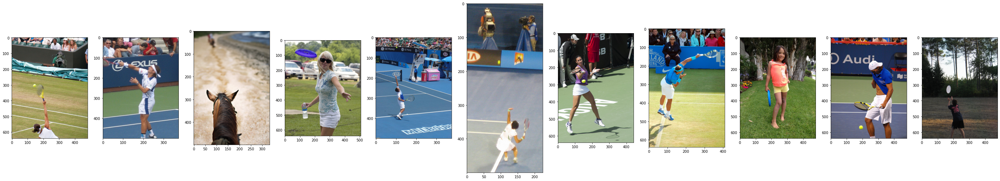

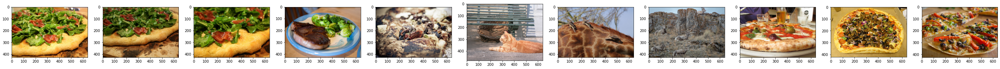

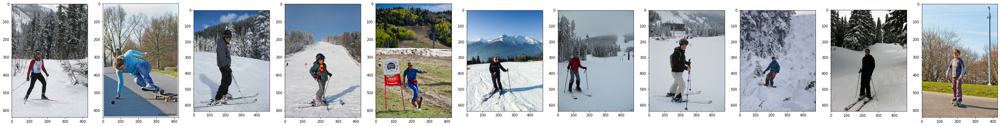

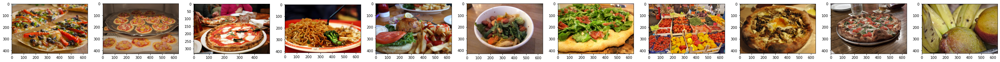

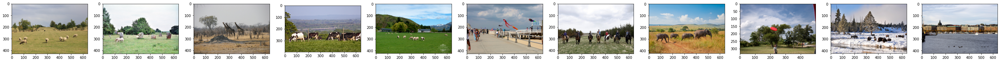

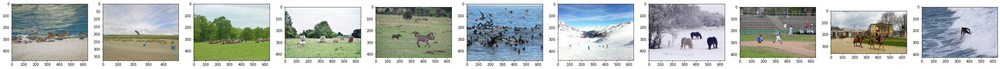

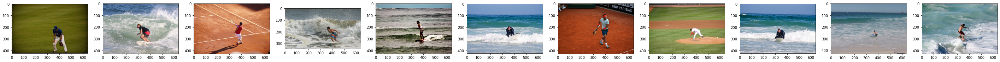

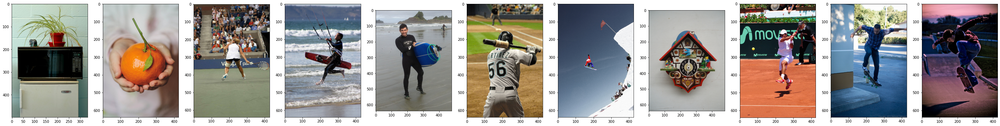

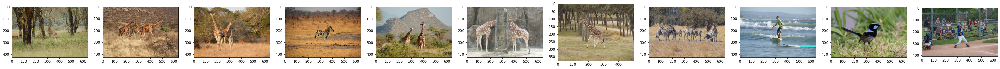

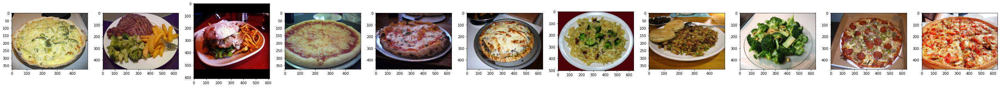

In [18]:
for j in range(len(coco_urls)):
    fig = plt.figure(1, figsize=(50, 10))

    for i, img_url in enumerate(coco_urls[j]):
        fig.add_subplot(1, len(coco_urls[0]), i+1)
        img = io.imread(img_url)
        plt.imshow(img)
    
    plt.show()

### Precision & Recall for ANNOY (DenseNet Inspired Embeddings)

In [19]:
%load_ext autoreload

In [20]:
%autoreload

In [21]:
import performance_metrics

In [22]:
# returns category precision @ k = 4
# returns supercategory precision @ k = 4
annoy_prec = [performance_metrics.annoy_precision(u, idx, idx2Img) for idx in query_idxs]
annoy_prec

[(0.5, 0.5),
 (0.0, 0.0),
 (1.0, 1.0),
 (0.0, 0.75),
 (0.5, 1.0),
 (0.0, 0.75),
 (0.25, 0.25),
 (0.0, 0.0),
 (0.75, 1.0),
 (0.25, 0.5)]

In [23]:
indices_to_get = [1, 2, -2]

In [27]:
# returns category precision @ k = 4
# returns supercategory precision @ k = 4
annoy_avg_prec = np.mean([annoy_prec[i] for i in indices_to_get], axis=0)
annoy_avg_prec

array([0.58333333, 0.66666667])

In [28]:
annoy_rec = [performance_metrics.annoy_recall(u, idx, idx2Img) for idx in query_idxs]
annoy_rec

[(1.0, 1.0),
 (0, 0),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (0, 0),
 (1.0, 1.0),
 (1.0, 1.0)]

In [29]:
# returns category precision @ k = 4
# returns supercategory precision @ k = 4
annoy_avg_recall = np.mean([annoy_rec[i] for i in indices_to_get], axis=0)
annoy_avg_recall

array([0.66666667, 0.66666667])